In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering
import matplotlib as mpl
from feature_engine.outliers import Winsorizer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from yellowbrick.cluster import KElbowVisualizer
from matplotlib.ticker import FixedLocator, FixedFormatter
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import plotly.express as px

## Data loading

In [2]:
df = pd.read_csv('customer.csv')
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Channel           440 non-null    int64
 1   Region            440 non-null    int64
 2   Fresh             440 non-null    int64
 3   Milk              440 non-null    int64
 4   Grocery           440 non-null    int64
 5   Frozen            440 non-null    int64
 6   Detergents_Paper  440 non-null    int64
 7   Delicassen        440 non-null    int64
dtypes: int64(8)
memory usage: 27.6 KB


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Channel,440.0,1.322727,0.468052,1.0,1.00,1.0,2.00,2.0
Region,440.0,2.543182,0.774272,1.0,2.00,3.0,3.00,3.0
Fresh,440.0,12000.297727,12647.328865,3.0,3127.75,8504.0,16933.75,112151.0
Milk,440.0,5796.265909,7380.377175,55.0,1533.00,3627.0,7190.25,73498.0
Grocery,440.0,7951.277273,9503.162829,3.0,2153.00,4755.5,10655.75,92780.0
Frozen,440.0,3071.931818,4854.673333,25.0,742.25,1526.0,3554.25,60869.0
Detergents_Paper,440.0,2881.493182,4767.854448,3.0,256.75,816.5,3922.00,40827.0
Delicassen,440.0,1524.870455,2820.105937,3.0,408.25,965.5,1820.25,47943.0


In [5]:
df.isnull().sum()

Channel             0
Region              0
Fresh               0
Milk                0
Grocery             0
Frozen              0
Detergents_Paper    0
Delicassen          0
dtype: int64

## Explanatory Data Analysis

In [6]:
warnings.filterwarnings('ignore')

In [7]:
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

  0%|                                                                                         | 0/1352 [00:00<…


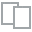
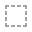
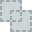
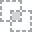
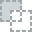
...
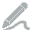
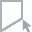
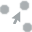
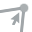
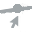

In [8]:
create_report(df).show()

<AxesSubplot:xlabel='Detergents_Paper', ylabel='Milk'>

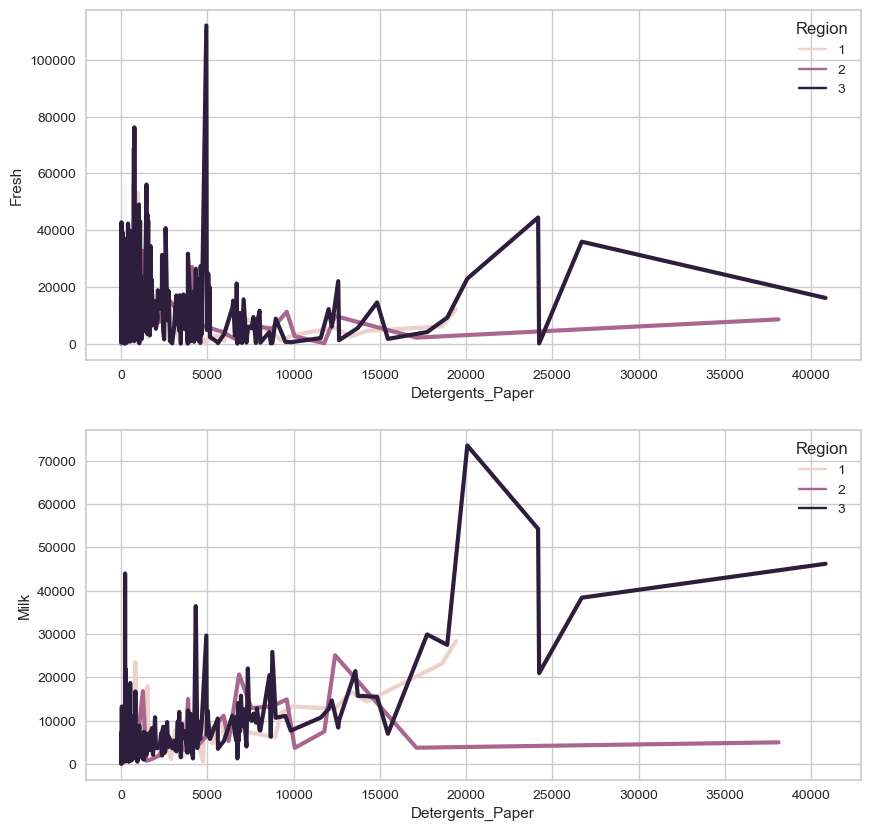

In [9]:
fig, ax = plt.subplots(2,1,figsize=(10,10))

sns.lineplot(data=df, x='Detergents_Paper', y='Fresh', hue='Region', lw=3, ax=ax[0])
sns.lineplot(data=df, x='Detergents_Paper', y='Milk', hue='Region', lw=3, ax=ax[1])

## Handling outliers

In [10]:
def diagnostic_plots(df, variable):
    plt.figure(figsize=(16,4))
    
    plt.subplot(1, 2, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    
    plt.show()
    
    print('skewnes: ', df[variable].skew())
    if (df[variable].skew() >= -.5) | (df[variable].skew() <= .5):
        print('the distribution is skewed')
    else:
        print('the distribution is normal')

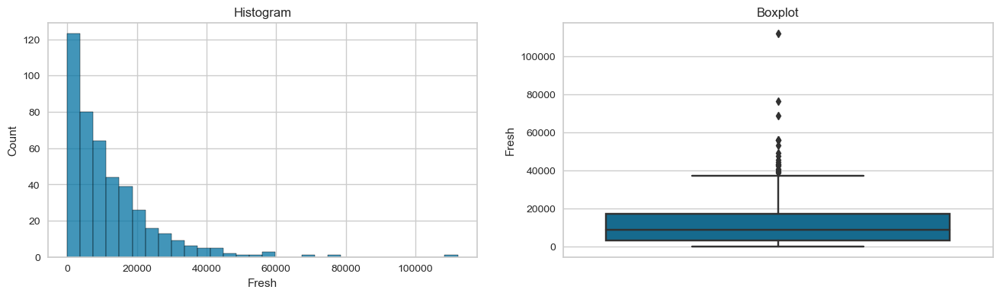

skewnes:  2.561322751927935
the distribution is skewed


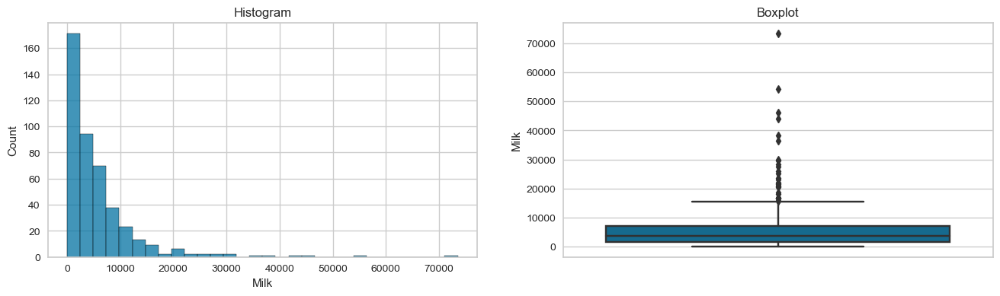

skewnes:  4.053754849210881
the distribution is skewed


In [11]:
diagnostic_plots(df, 'Fresh')
diagnostic_plots(df, 'Milk')

In [12]:
def find_skewed_boundaries(df, variable, distance):
    IQR = df[variable].quantile(.75) - df[variable].quantile(.25)
    
    lower_boundary = df[variable].quantile(.25) - (IQR*distance)
    upper_boundary = df[variable].quantile(.25) + (IQR*distance)
    
    return upper_boundary, lower_boundary

In [13]:
upper_fresh, lower_fresh = find_skewed_boundaries(df, 'Fresh', 1.5)
print(f'Upper fresh and lower fresh = {upper_fresh} and {lower_fresh}')

upper_milk, lower_milk = find_skewed_boundaries(df, 'Milk', 1.5)
print(f'Upper milk and lower milk = {upper_milk} and {lower_milk}')

Upper fresh and lower fresh = 23836.75 and -17581.25
Upper milk and lower milk = 10018.875 and -6952.875


In [14]:
def find_outlier(df, variable, upper, lower):
    return df[
        (df[variable] > upper) | (df[variable] > upper)
    ].sum()

In [15]:
print('Fresh :', (find_outlier(df, 'Fresh', upper_fresh, lower_fresh)).shape[0])
print('Milk :', (find_outlier(df, 'Milk', upper_milk, lower_milk)).shape[0])

Fresh : 8
Milk : 8


In [16]:
windsoriser = Winsorizer(capping_method='iqr', tail='right',
                        fold=1.5, variables=['Fresh', 'Milk'])

windsoriser.fit(df)

df_fin = windsoriser.transform(df)

## Feature selection

In [17]:
df_fin.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669.0,9656.0,7561,214,2674,1338
1,2,3,7057.0,9810.0,9568,1762,3293,1776
2,2,3,6353.0,8808.0,7684,2405,3516,7844
3,1,3,13265.0,1196.0,4221,6404,507,1788
4,2,3,22615.0,5410.0,7198,3915,1777,5185


In [18]:
cat_columns = ['Channel','Region']
num_columns = ['Fresh', 'Milk', 'Grocery', 'Frozen','Detergents_Paper',
               'Delicassen']

In [19]:
df_num = df_fin[num_columns]
df_cat = df_fin[cat_columns]

In [20]:
df_num

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,12669.00,9656.0,7561,214,2674,1338
1,7057.00,9810.0,9568,1762,3293,1776
2,6353.00,8808.0,7684,2405,3516,7844
3,13265.00,1196.0,4221,6404,507,1788
4,22615.00,5410.0,7198,3915,1777,5185
...,...,...,...,...,...,...
435,29703.00,12051.0,16027,13135,182,2204
436,37642.75,1431.0,764,4510,93,2346
437,14531.00,15488.0,30243,437,14841,1867
438,10290.00,1981.0,2232,1038,168,2125


## Feature scalling

In [21]:
scaler = MinMaxScaler()
scaler.fit(df_num)

df_num_scaled = scaler.transform(df_num)
df_num_scaled

array([[3.36505954e-01, 6.14616425e-01, 8.14641560e-02, 3.10630465e-03,
        6.54271997e-02, 2.78473091e-02],
       [1.87408259e-01, 6.24474870e-01, 1.03096673e-01, 2.85484189e-02,
        8.05898491e-02, 3.69837297e-02],
       [1.68704627e-01, 5.60330962e-01, 8.27899156e-02, 3.91164289e-02,
        8.60523222e-02, 1.63558615e-01],
       ...,
       [3.85974933e-01, 9.87957013e-01, 3.25942852e-01, 6.77141542e-03,
        3.63462669e-01, 3.88819358e-02],
       [2.73301496e-01, 1.23294577e-01, 2.40253511e-02, 1.66491355e-02,
        4.04174015e-03, 4.42636629e-02],
       [7.39643595e-02, 1.05178084e-01, 2.70217834e-02, 6.57418973e-04,
        1.16108172e-02, 1.02211097e-03]])

## Dimension reduction

In [22]:
df_final = pd.DataFrame(df_num_scaled, columns=num_columns)
df_final

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0.336506,0.614616,0.081464,0.003106,0.065427,0.027847
1,0.187408,0.624475,0.103097,0.028548,0.080590,0.036984
2,0.168705,0.560331,0.082790,0.039116,0.086052,0.163559
3,0.352340,0.073042,0.045464,0.104842,0.012346,0.037234
4,0.600748,0.342805,0.077552,0.063934,0.043455,0.108093
...,...,...,...,...,...,...
435,0.789059,0.767934,0.172715,0.215469,0.004385,0.045912
436,1.000000,0.088086,0.008202,0.073713,0.002205,0.048874
437,0.385975,0.987957,0.325943,0.006771,0.363463,0.038882
438,0.273301,0.123295,0.024025,0.016649,0.004042,0.044264


### VIF

In [23]:
vif_data = pd.DataFrame()
vif_data['features'] = df_final.columns

vif_data['VIF'] = [variance_inflation_factor(df_final.values, i) for i in range(len(df_final.columns))]

vif_data.sort_values(by='VIF', ascending=False)

,features,VIF
2,Grocery,15.604597
4,Detergents_Paper,10.914977
1,Milk,3.910543
0,Fresh,1.905706
3,Frozen,1.787349
5,Delicassen,1.782404


## EVR 

In [24]:
pca = PCA()
pca.fit(df_final)
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= .95) + 1
print(cumsum)
print(d)

[0.49228307 0.88909498 0.95247451 0.98324338 0.99621863 1.        ]
3


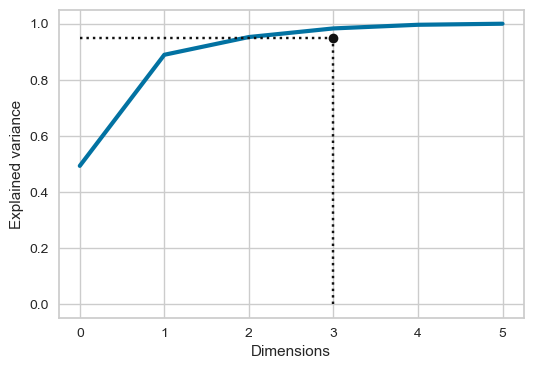

In [25]:
plt.figure(figsize=(6,4))
plt.plot(cumsum, linewidth=3)
plt.xlabel('Dimensions')
plt.ylabel('Explained variance')
plt.plot([d,d], [0,0.95],'k:')
plt.plot([0,d], [0.95,0.95],'k:')
plt.plot(d,0.95,'ko')
plt.grid(True)
plt.show()

## PCA 

In [26]:
pca = PCA(n_components=3)
pca.fit(df_final)
df_reduce = pca.transform(df_final)

## n cluster

In [27]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=21).fit(df_reduce) 
                for k in range(1,9)]

Elbow method


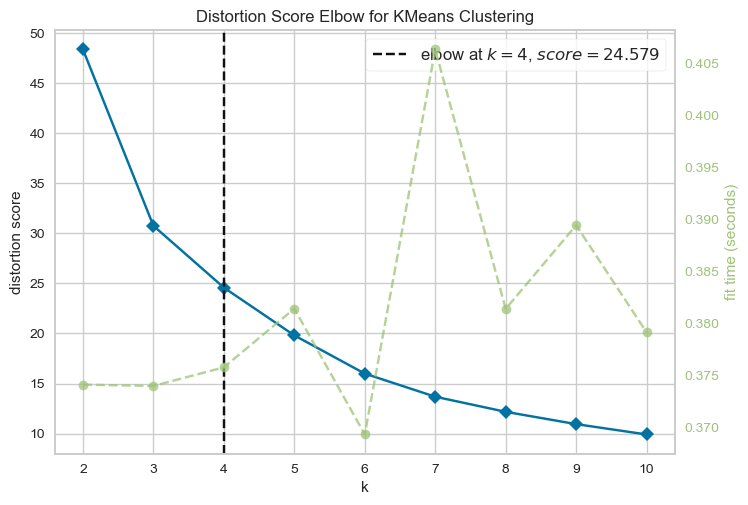

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [28]:
print('Elbow method')
Elbow_M = KElbowVisualizer(KMeans(), K=8)
Elbow_M.fit(df_reduce)
Elbow_M.show()

In [29]:
k = [2,3,4,5,6,7,8,9]

kmeans_per_k = [KMeans(n_clusters=k, random_state=21).fit(df_reduce) 
                for k in range(1,9)]

inertia = [model.inertia_ for model in kmeans_per_k]

In [30]:
inertia

[77.94395443707442,
 48.348771372663506,
 30.747826714464043,
 24.590113830583995,
 19.8092905545428,
 15.962300209576412,
 13.71237077363446,
 12.186095014672208]

In [31]:
silhouette_scores = [silhouette_score(df_reduce, model.labels_) 
                     for model in kmeans_per_k[1:]]

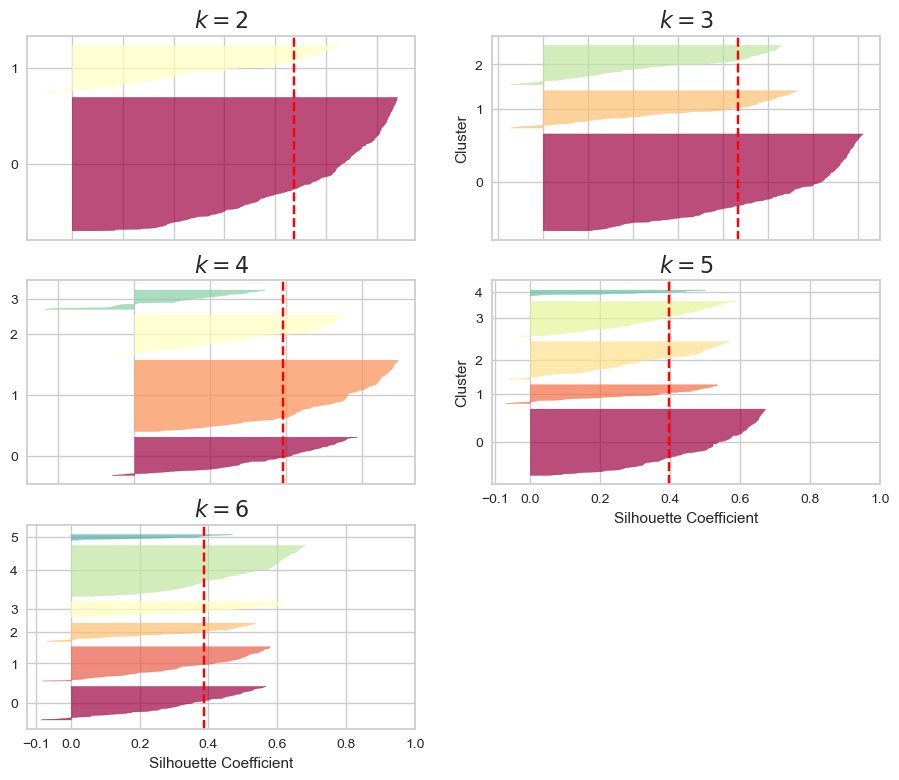

In [32]:

plt.figure(figsize=(11, 9))

for k in (2, 3, 4, 5, 6):
    plt.subplot(3, 2, k - 1)
    
    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(df_reduce, y_pred)

    padding = len(df_reduce) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 5):
        plt.ylabel("Cluster")
    
    if k in (5, 6):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

plt.show()

## Model Training

### K means

In [33]:
kmeans = KMeans(n_clusters=4, random_state=21)
kmeans.fit(df_reduce)

KMeans(n_clusters=4, random_state=21)

### Agglomerative

In [34]:
agglo = AgglomerativeClustering(n_clusters=4)
agglo.fit(df_reduce)

AgglomerativeClustering(n_clusters=4)

### Spectral

In [35]:
spectral = SpectralClustering(n_clusters=4, random_state=21)
spectral.fit(df_reduce)

SpectralClustering(n_clusters=4, random_state=21)

## Model evaluation

### 2 Dimension

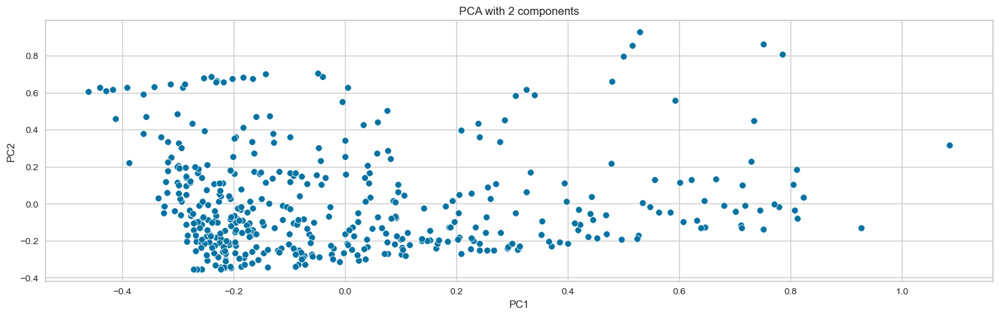

In [36]:
pca_2d = PCA(n_components=2, random_state=21)
x_2d = pca_2d.fit_transform(df_reduce)

plt.figure(figsize=(18,5))
sns.scatterplot(x=x_2d[:, 0], y=x_2d[:,1])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA with 2 components')
plt.show()

In [38]:
df_cluster = df_fin.copy()
df_cluster['Cluster K Means'] = kmeans.labels_
df_cluster['Cluster Agglomerative'] = agglo.labels_
df_cluster['Cluster spectral'] = spectral.labels_

df_cluster

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,Cluster K Means,Cluster Agglomerative,Cluster spectral
0,2,3,12669.00,9656.0,7561,214,2674,1338,0,3,3
1,2,3,7057.00,9810.0,9568,1762,3293,1776,0,3,3
2,2,3,6353.00,8808.0,7684,2405,3516,7844,0,3,3
3,1,3,13265.00,1196.0,4221,6404,507,1788,1,0,1
4,2,3,22615.00,5410.0,7198,3915,1777,5185,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...
435,1,3,29703.00,12051.0,16027,13135,182,2204,3,2,0
436,1,3,37642.75,1431.0,764,4510,93,2346,2,2,0
437,2,3,14531.00,15488.0,30243,437,14841,1867,3,1,3
438,1,3,10290.00,1981.0,2232,1038,168,2125,1,0,1


### K Means 

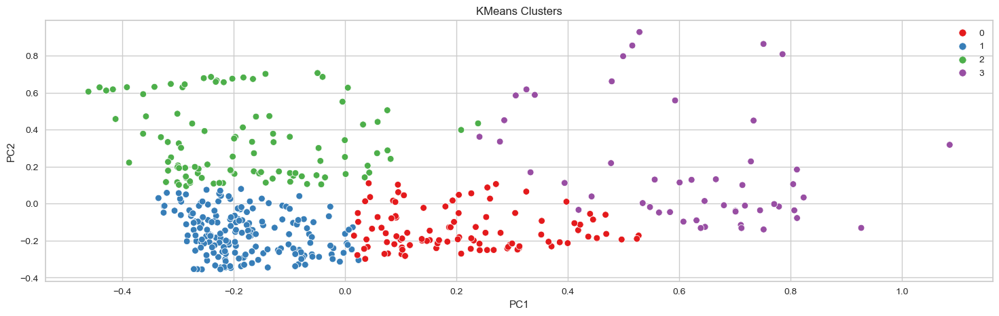

In [39]:
plt.figure(figsize=(18,5))
sns.scatterplot(x=x_2d[:, 0], y=x_2d[:,1], hue=kmeans.labels_, palette='Set1')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('KMeans Clusters')
plt.show()

### Agglomerative

Text(0.5, 1.0, 'Agglomerative Clusters')

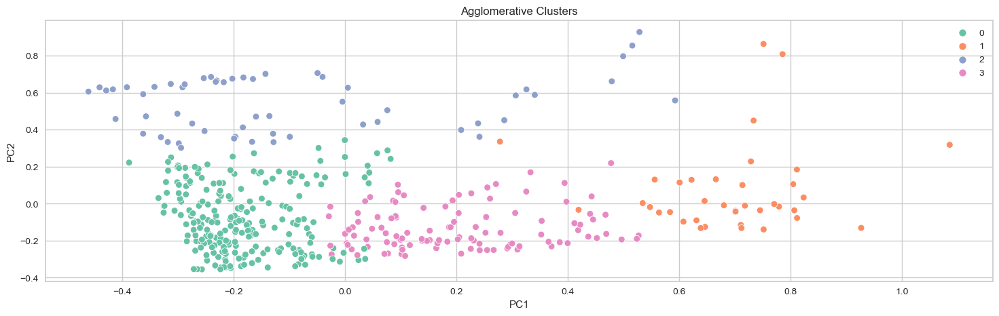

In [40]:
plt.figure(figsize=(18,5))
sns.scatterplot(x=x_2d[:,0], y=x_2d[:,1], hue=agglo.labels_, palette='Set2')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Agglomerative Clusters')

### Spectral

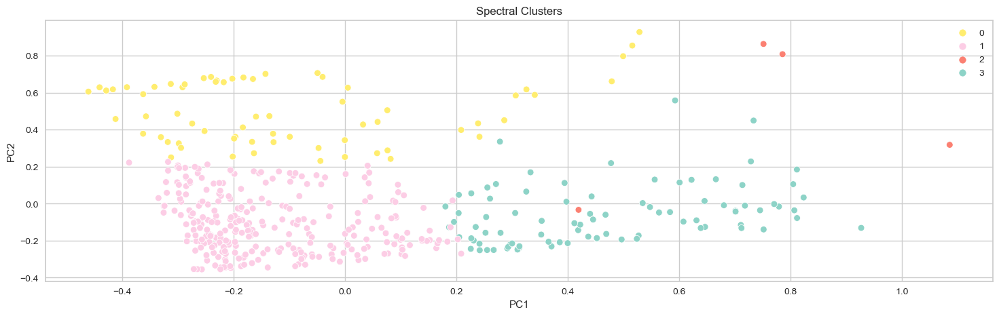

In [42]:
plt.figure(figsize=(18,5))
sns.scatterplot(x=x_2d[:,0], y=x_2d[:,1], hue=spectral.labels_, palette='Set3_r')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Spectral Clusters')
plt.show()

### 3D mapping

In [43]:
pca_3d = PCA(n_components=3, random_state=21)
x_3d = pca_3d.fit_transform(df_reduce)

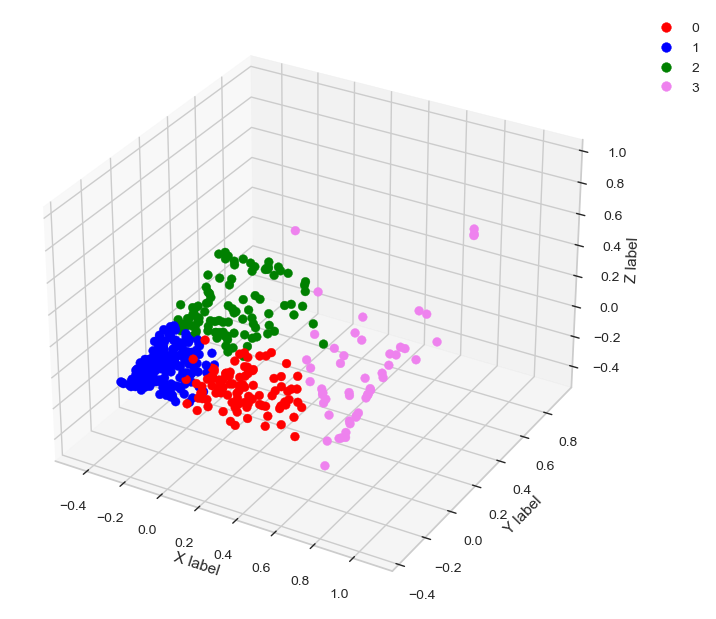

In [44]:
x = x_3d[:, 0]
y = x_3d[:, 1]
z = x_3d[:, 2]

fig = plt.figure(figsize=(6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

colors = ["red","blue","green","Violet"]
cmap = ListedColormap(colors=colors)

sc = ax.scatter(x, y, z, s=40, c=kmeans.labels_, cmap=cmap, alpha=1)

ax.set_xlabel('X label')
ax.set_ylabel('Y label')
ax.set_zlabel('Z label')

plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

plt.show()

## EDA After Clustering

### K Means

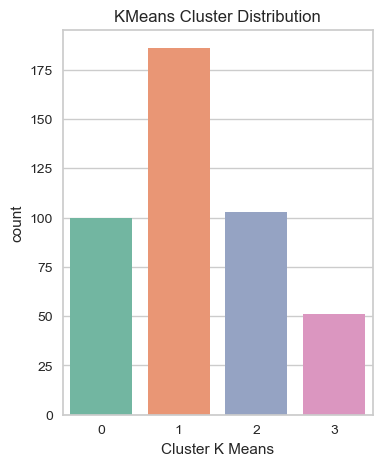

In [60]:
plt.figure(figsize=(4,5))
sns.countplot(data=df_cluster, x='Cluster K Means', palette='Set2')
plt.title('KMeans Cluster Distribution')
plt.show()

### Agglomerative 

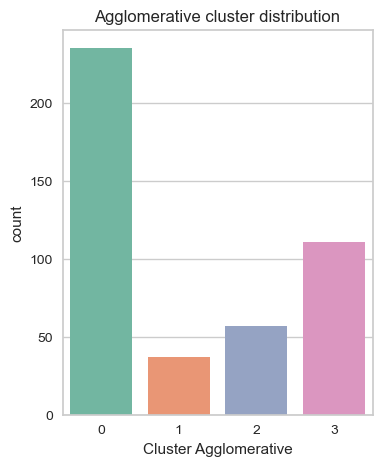

In [61]:
plt.figure(figsize=(4,5))
sns.countplot(data=df_cluster, x='Cluster Agglomerative', palette='Set2')
plt.title('Agglomerative cluster distribution')
plt.show()

### Spectral

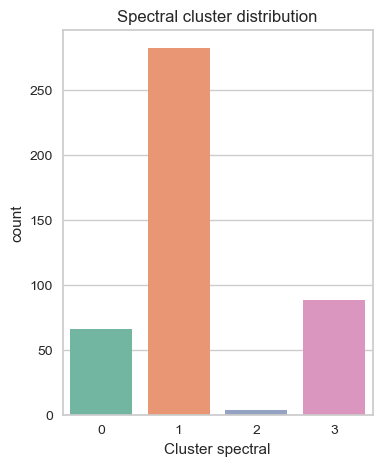

In [64]:
plt.figure(figsize=(4,5))
sns.countplot(data=df_cluster, x='Cluster spectral', palette='Set2')
plt.title('Spectral cluster distribution')
plt.show()

### Silhoutte score

In [49]:
print('Silhoutte score KMeans       : ', silhouette_score(df_reduce, kmeans.labels_))
print('Silhoutte score Agglomerative: ', silhouette_score(df_reduce, agglo.labels_))
print('Silhoutte score Spectral     : ', silhouette_score(df_reduce, spectral.labels_))

Silhoutte score KMeans       :  0.3935140701174788
Silhoutte score Agglomerative:  0.37583651310614513
Silhoutte score Spectral     :  0.45553367138426765


### Final cluster : spectral

In [50]:
cluster_0 = df_cluster[df_cluster['Cluster K Means'] == 0]
cluster_1 = df_cluster[df_cluster['Cluster K Means'] == 1]
cluster_2 = df_cluster[df_cluster['Cluster K Means'] == 2]
cluster_3 = df_cluster[df_cluster['Cluster K Means'] == 3]

In [54]:
final = pd.DataFrame()
final['Cluster'] = [0,1,2,3]

for i in num_columns:
    data = []
    data.append(cluster_0[i].mean())
    data.append(cluster_1[i].mean())
    data.append(cluster_2[i].mean())
    data.append(cluster_3[i].mean())
    
    final[i] = data

In [55]:
final

,Cluster,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0,4594.400000,7707.220000,10892.900000,1607.290000,4803.530000,1415.410000
1,1,6854.575269,1971.521505,3370.930108,2722.844086,797.080645,846.725806
2,2,25081.694175,3501.922330,5082.728155,4176.864078,1109.359223,1753.097087
3,3,13324.009804,14181.519608,24681.529412,4985.392157,10293.784314,3751.803922


<AxesSubplot:ylabel='Cluster'>

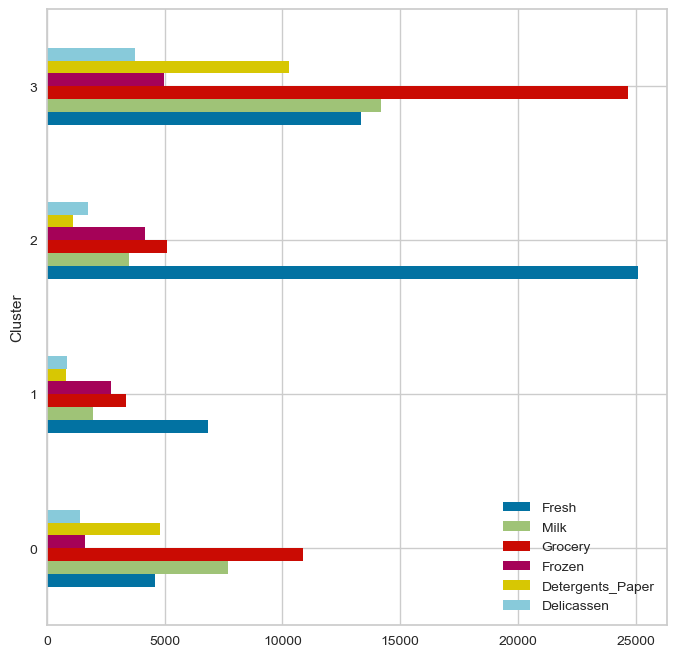

In [59]:
data_plot = final.set_index('Cluster')
data_plot.plot(kind='barh', figsize=(8,8))